In [4]:
import re, string, unicodedata
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
# import inflect
import pandas as pd
# nltk.download('stopwords')

In [5]:
f = open("dataset/passage_collection_new.txt", 'r', encoding = 'utf-8') 

In [6]:
document = f.read()

In [7]:
document[0:300]

'This is the definition of RNA along with examples of types of RNA molecules. This is the definition of RNA along with examples of types of RNA molecules. RNA Definition\nBest Answer: The AR designation comes from the name of the company that produced the firearm - Armalite. It is a common misconcepti'

In [8]:
header_list = ["qid", "pid", "query", "passage"]
candidate_passages_top1000 = pd.read_csv("dataset/candidate_passages_top1000.tsv", sep='\t', names=header_list)

In [9]:
candidate_passages_top1000

,qid,pid,query,passage
0,494835,7130104,"sensibilities, definition",This is the definition of RNA along with examp...
1,1128373,7130104,iur definition,This is the definition of RNA along with examp...
2,131843,7130104,definition of a sigmet,This is the definition of RNA along with examp...
3,20455,7130335,ar glasses definition,Best Answer: The AR designation comes from the...
4,719381,7130335,what is ar balance,Best Answer: The AR designation comes from the...
...,...,...,...,...
189872,1056204,79980,who was the first steam boat operator,Other operators with special formats accept mo...
189873,1132213,7998257,how long to hold bow in yoga,You may be surprised that to learn that yoga t...
189874,324211,7998651,how much money a united airline get as a capta...,Find cheap airline tickets & deals on flights ...
189875,1116341,7998709,closed ended mortgage definition,"What is a wrap-around mortgage, and who is it ..."


In [10]:
header_list = ["qid", "query"]
test_queries = pd.read_csv("dataset/test-queries.tsv", sep='\t', names=header_list)

In [11]:
test_queries

,qid,query
0,1108939,what slows down the flow of blood
1,1112389,"what is the county for grand rapids, mn"
2,792752,what is ruclip
3,1119729,what do you do when you have a nosebleed from ...
4,1105095,where is sugar lake lodge located
...,...,...
195,146187,difference between a mcdouble and a double che...
196,634428,what does chs stand for?
197,1121986,what are the effects of having low blood sugar
198,321441,how much is a us postal stamp cost


# Preprocessing

## Lowercase

In [12]:
document = document.lower()

## Tokenizing

In [13]:
# nltk.download('punkt')
tokens = nltk.word_tokenize(document)


In [14]:
tokens

['this',
 'is',
 'the',
 'definition',
 'of',
 'rna',
 'along',
 'with',
 'examples',
 'of',
 'types',
 'of',
 'rna',
 'molecules',
 '.',
 'this',
 'is',
 'the',
 'definition',
 'of',
 'rna',
 'along',
 'with',
 'examples',
 'of',
 'types',
 'of',
 'rna',
 'molecules',
 '.',
 'rna',
 'definition',
 'best',
 'answer',
 ':',
 'the',
 'ar',
 'designation',
 'comes',
 'from',
 'the',
 'name',
 'of',
 'the',
 'company',
 'that',
 'produced',
 'the',
 'firearm',
 '-',
 'armalite',
 '.',
 'it',
 'is',
 'a',
 'common',
 'misconception',
 'that',
 'it',
 'stands',
 'for',
 'assault',
 'rifle',
 '.',
 'from',
 'wikipedia',
 ':',
 'the',
 'ar-15',
 'is',
 'based',
 'on',
 'the',
 '7.62mm',
 'ar-10',
 ',',
 'designed',
 'by',
 'eugene',
 'stoner',
 'of',
 'the',
 'fairchild',
 'armalite',
 'corporation',
 '.',
 'what',
 'does',
 'ar',
 'really',
 'mean',
 '?',
 'posted',
 'by',
 'quality',
 'ar',
 'barrels',
 '|',
 'jul',
 '29',
 ',',
 '2016',
 '|',
 'ar',
 'articles',
 '|',
 'over',
 'the',
 'yea

## Remove Punctuation

In [15]:
def remove_punctuation(tokens):
    new_tokens = []
    for token in tokens:
        new_token = re.sub(r'[^\w\s]', '', token)
        if new_token != '':
            new_tokens.append(new_token)
    return new_tokens

In [16]:
tokens = remove_punctuation(tokens)

In [17]:
tokens

['this',
 'is',
 'the',
 'definition',
 'of',
 'rna',
 'along',
 'with',
 'examples',
 'of',
 'types',
 'of',
 'rna',
 'molecules',
 'this',
 'is',
 'the',
 'definition',
 'of',
 'rna',
 'along',
 'with',
 'examples',
 'of',
 'types',
 'of',
 'rna',
 'molecules',
 'rna',
 'definition',
 'best',
 'answer',
 'the',
 'ar',
 'designation',
 'comes',
 'from',
 'the',
 'name',
 'of',
 'the',
 'company',
 'that',
 'produced',
 'the',
 'firearm',
 'armalite',
 'it',
 'is',
 'a',
 'common',
 'misconception',
 'that',
 'it',
 'stands',
 'for',
 'assault',
 'rifle',
 'from',
 'wikipedia',
 'the',
 'ar15',
 'is',
 'based',
 'on',
 'the',
 '762mm',
 'ar10',
 'designed',
 'by',
 'eugene',
 'stoner',
 'of',
 'the',
 'fairchild',
 'armalite',
 'corporation',
 'what',
 'does',
 'ar',
 'really',
 'mean',
 'posted',
 'by',
 'quality',
 'ar',
 'barrels',
 'jul',
 '29',
 '2016',
 'ar',
 'articles',
 'over',
 'the',
 'years',
 'the',
 'media',
 'has',
 'programmed',
 'the',
 'public',
 'into',
 'thinking',


## Remove Stopwords

In [18]:
def remove_stopwords(tokens):
    new_tokens = []
    stopword_set = set(stopwords.words('english'))
    for token in tokens:
        if token not in stopword_set:
            new_tokens.append(token)
    return new_tokens


In [19]:
# nltk.download('stopwords')
tokens = remove_stopwords(tokens)

In [20]:
tokens

['definition',
 'rna',
 'along',
 'examples',
 'types',
 'rna',
 'molecules',
 'definition',
 'rna',
 'along',
 'examples',
 'types',
 'rna',
 'molecules',
 'rna',
 'definition',
 'best',
 'answer',
 'ar',
 'designation',
 'comes',
 'name',
 'company',
 'produced',
 'firearm',
 'armalite',
 'common',
 'misconception',
 'stands',
 'assault',
 'rifle',
 'wikipedia',
 'ar15',
 'based',
 '762mm',
 'ar10',
 'designed',
 'eugene',
 'stoner',
 'fairchild',
 'armalite',
 'corporation',
 'ar',
 'really',
 'mean',
 'posted',
 'quality',
 'ar',
 'barrels',
 'jul',
 '29',
 '2016',
 'ar',
 'articles',
 'years',
 'media',
 'programmed',
 'public',
 'thinking',
 'ar',
 'stands',
 'assault',
 'rifle',
 'case',
 'follow',
 'short',
 'history',
 'overview',
 'armalite',
 'rifle',
 'oxycontin',
 'generally',
 'prescribed',
 'without',
 'acetominophen',
 'oxycodone',
 'generally',
 'prescribed',
 'show',
 'drug',
 'panel',
 'last',
 'system',
 'upto',
 '5',
 'days',
 'last',
 'dose',
 'depending',
 'frequ

## Lemmatization

In [21]:
def lemmatize_verbs(tokens):
    lemmatizer = WordNetLemmatizer()
    root_words = []
    for token in tokens:
        root_word = lemmatizer.lemmatize(token, pos='v')
#         root_word = lemmatizer.lemmatize(token, pos='n')
#         root_word = lemmatizer.lemmatize(token, pos='a')
        root_words.append(root_word)
    return root_words

In [22]:
# nltk.download('wordnet')
tokens = lemmatize_verbs(tokens)

In [23]:
tokens

['definition',
 'rna',
 'along',
 'examples',
 'type',
 'rna',
 'molecules',
 'definition',
 'rna',
 'along',
 'examples',
 'type',
 'rna',
 'molecules',
 'rna',
 'definition',
 'best',
 'answer',
 'ar',
 'designation',
 'come',
 'name',
 'company',
 'produce',
 'firearm',
 'armalite',
 'common',
 'misconception',
 'stand',
 'assault',
 'rifle',
 'wikipedia',
 'ar15',
 'base',
 '762mm',
 'ar10',
 'design',
 'eugene',
 'stoner',
 'fairchild',
 'armalite',
 'corporation',
 'ar',
 'really',
 'mean',
 'post',
 'quality',
 'ar',
 'barrel',
 'jul',
 '29',
 '2016',
 'ar',
 'article',
 'years',
 'media',
 'program',
 'public',
 'think',
 'ar',
 'stand',
 'assault',
 'rifle',
 'case',
 'follow',
 'short',
 'history',
 'overview',
 'armalite',
 'rifle',
 'oxycontin',
 'generally',
 'prescribe',
 'without',
 'acetominophen',
 'oxycodone',
 'generally',
 'prescribe',
 'show',
 'drug',
 'panel',
 'last',
 'system',
 'upto',
 '5',
 'days',
 'last',
 'dose',
 'depend',
 'frequency',
 'strength',
 'pe

## Remove numbers

In [24]:
def remove_numbers(tokens):
    """Replace all interger occurrences in list of tokenized words with textual representation"""
    new_tokens = []
    for token in tokens:
        if token.isdigit():
#             new_token = num2words(int(token), to = 'ordinal')
#             new_tokens.append(new_token)
            pass
        else:
            new_tokens.append(token)
    return new_tokens

In [25]:
tokens = remove_numbers(tokens)


In [26]:
len(tokens)

5889367

## Zipf's law

### When demonstrating Zipf's law, we should keep all the stop words, otherwise, the law may not hold.

In [27]:
import collections

In [28]:
word_frequencies = collections.Counter(tokens)

In [29]:
word_frequencies

Counter({'definition': 12801,
         'rna': 507,
         'along': 2661,
         'examples': 1424,
         'type': 16762,
         'molecules': 1501,
         'best': 6782,
         'answer': 4292,
         'ar': 1952,
         'designation': 113,
         'come': 6470,
         'name': 27906,
         'company': 5034,
         'produce': 5308,
         'firearm': 34,
         'armalite': 32,
         'common': 8164,
         'misconception': 61,
         'stand': 3931,
         'assault': 154,
         'rifle': 183,
         'wikipedia': 389,
         'ar15': 156,
         'base': 6975,
         '762mm': 1,
         'ar10': 33,
         'design': 4443,
         'eugene': 47,
         'stoner': 18,
         'fairchild': 5,
         'corporation': 560,
         'really': 1952,
         'mean': 22868,
         'post': 2046,
         'quality': 1821,
         'barrel': 302,
         'jul': 55,
         'article': 1898,
         'years': 13607,
         'media': 708,
         'program'

In [30]:
top_word_frequencies = word_frequencies.most_common()

In [31]:
top_word_frequencies

[('use', 38483),
 ('name', 27906),
 ('one', 26025),
 ('number', 25664),
 ('mean', 22868),
 ('also', 21628),
 ('cost', 20743),
 ('may', 20526),
 ('cause', 18876),
 ('make', 18595),
 ('state', 17995),
 ('time', 17231),
 ('type', 16762),
 ('first', 15398),
 ('blood', 15127),
 ('find', 14851),
 ('get', 14455),
 ('part', 14257),
 ('include', 14130),
 ('years', 13607),
 ('call', 13562),
 ('take', 13349),
 ('new', 12985),
 ('two', 12913),
 ('definition', 12801),
 ('need', 12791),
 ('know', 12725),
 ('work', 12369),
 ('people', 12192),
 ('many', 11982),
 ('per', 11518),
 ('average', 11498),
 ('service', 10883),
 ('function', 10846),
 ('body', 10676),
 ('see', 10583),
 ('level', 10195),
 ('like', 10014),
 ('temperature', 9860),
 ('tax', 9740),
 ('form', 9671),
 ('price', 9475),
 ('year', 9272),
 ('us', 9172),
 ('county', 8862),
 ('help', 8783),
 ('go', 8739),
 ('phone', 8522),
 ('american', 8497),
 ('drive', 8459),
 ('health', 8415),
 ('nt', 8335),
 ('give', 8293),
 ('common', 8164),
 ('differe

In [32]:
top_word_frequencies[0][1]

38483

In [33]:
def zipf_table(top_word_frequencies):
    zipf_table = []

    top_frequency = top_word_frequencies[0][1]

    for index, item in enumerate(top_word_frequencies, start=1):

        relative_frequency = "1/{}".format(index)
        zipf_frequency = top_frequency * (1 / index)
        difference_actual = item[1] - zipf_frequency
        difference_percent = (item[1] / zipf_frequency) * 100

        zipf_table.append({"word": item[0],
                           "actual_frequency": item[1],
                           "relative_frequency": relative_frequency,
                           "zipf_frequency": zipf_frequency,
                           "difference_actual": difference_actual,
                           "difference_percent": difference_percent})

    return zipf_table


In [34]:
zipf_table(top_word_frequencies)

[{'word': 'use',
  'actual_frequency': 38483,
  'relative_frequency': '1/1',
  'zipf_frequency': 38483.0,
  'difference_actual': 0.0,
  'difference_percent': 100.0},
 {'word': 'name',
  'actual_frequency': 27906,
  'relative_frequency': '1/2',
  'zipf_frequency': 19241.5,
  'difference_actual': 8664.5,
  'difference_percent': 145.03027310760595},
 {'word': 'one',
  'actual_frequency': 26025,
  'relative_frequency': '1/3',
  'zipf_frequency': 12827.666666666666,
  'difference_actual': 13197.333333333334,
  'difference_percent': 202.88179196008628},
 {'word': 'number',
  'actual_frequency': 25664,
  'relative_frequency': '1/4',
  'zipf_frequency': 9620.75,
  'difference_actual': 16043.25,
  'difference_percent': 266.75674973364863},
 {'word': 'mean',
  'actual_frequency': 22868,
  'relative_frequency': '1/5',
  'zipf_frequency': 7696.6,
  'difference_actual': 15171.4,
  'difference_percent': 297.1182080399137},
 {'word': 'also',
  'actual_frequency': 21628,
  'relative_frequency': '1/6',

In [35]:
def print_zipf_table(zipf_table):

    """
    Prints the list created by generate_zipf_table
    in table format with column headings.
    """

    width = 80

    print("-" * width)
    print("|Rank|    Word    |Actual Freq | Zipf Frac  | Zipf Freq  |Actual Diff |Pct Diff|")
    print("-" * width)

    format_string = "|{:4}|{:12}|{:12.0f}|{:>12}|{:12.2f}|{:12.2f}|{:7.2f}%|"

    for index, item in enumerate(zipf_table, start=1):

        print(format_string.format(index,
                                   item["word"],
                                   item["actual_frequency"],
                                   item["relative_frequency"],
                                   item["zipf_frequency"],
                                   item["difference_actual"],
                                   item["difference_percent"]))

    print("-" * width)

In [36]:
print_zipf_table(zipf_table(top_word_frequencies))

--------------------------------------------------------------------------------
|Rank|    Word    |Actual Freq | Zipf Frac  | Zipf Freq  |Actual Diff |Pct Diff|
--------------------------------------------------------------------------------
|   1|use         |       38483|         1/1|    38483.00|        0.00| 100.00%|
|   2|name        |       27906|         1/2|    19241.50|     8664.50| 145.03%|
|   3|one         |       26025|         1/3|    12827.67|    13197.33| 202.88%|
|   4|number      |       25664|         1/4|     9620.75|    16043.25| 266.76%|
|   5|mean        |       22868|         1/5|     7696.60|    15171.40| 297.12%|
|   6|also        |       21628|         1/6|     6413.83|    15214.17| 337.21%|
|   7|cost        |       20743|         1/7|     5497.57|    15245.43| 377.31%|
|   8|may         |       20526|         1/8|     4810.38|    15715.62| 426.70%|
|   9|cause       |       18876|         1/9|     4275.89|    14600.11| 441.45%|
|  10|make        |       18

|2370|solutions   |         400|      1/2370|       16.24|      383.76|2463.43%|
|2371|players     |         400|      1/2371|       16.23|      383.77|2464.46%|
|2372|afternoon   |         400|      1/2372|       16.22|      383.78|2465.50%|
|2373|usual       |         399|      1/2373|       16.22|      382.78|2460.38%|
|2374|molecular   |         399|      1/2374|       16.21|      382.79|2461.41%|
|2375|relation    |         399|      1/2375|       16.20|      382.80|2462.45%|
|2376|rarely      |         399|      1/2376|       16.20|      382.80|2463.49%|
|2377|possibly    |         399|      1/2377|       16.19|      382.81|2464.52%|
|2378|variation   |         399|      1/2378|       16.18|      382.82|2465.56%|
|2379|shift       |         399|      1/2379|       16.18|      382.82|2466.60%|
|2380|snake       |         399|      1/2380|       16.17|      382.83|2467.64%|
|2381|tumor       |         398|      1/2381|       16.16|      381.84|2462.48%|
|2382|sore        |         

|4888|conventions |         140|      1/4888|        7.87|      132.13|1778.24%|
|4889|nondeductible|         140|      1/4889|        7.87|      132.13|1778.60%|
|4890|recall      |         140|      1/4890|        7.87|      132.13|1778.97%|
|4891|unlikely    |         139|      1/4891|        7.87|      131.13|1766.62%|
|4892|sensitivity |         139|      1/4892|        7.87|      131.13|1766.98%|
|4893|investigate |         139|      1/4893|        7.86|      131.14|1767.34%|
|4894|adhd        |         139|      1/4894|        7.86|      131.14|1767.71%|
|4895|elsewhere   |         139|      1/4895|        7.86|      131.14|1768.07%|
|4896|wise        |         139|      1/4896|        7.86|      131.14|1768.43%|
|4897|occurrence  |         139|      1/4897|        7.86|      131.14|1768.79%|
|4898|login       |         139|      1/4898|        7.86|      131.14|1769.15%|
|4899|abilities   |         139|      1/4899|        7.86|      131.14|1769.51%|
|4900|invade      |        

|7319|deplete     |          74|      1/7319|        5.26|       68.74|1407.39%|
|7320|gary        |          74|      1/7320|        5.26|       68.74|1407.58%|
|7321|boss        |          74|      1/7321|        5.26|       68.74|1407.77%|
|7322|linux       |          74|      1/7322|        5.26|       68.74|1407.97%|
|7323|nad         |          74|      1/7323|        5.26|       68.74|1408.16%|
|7324|viii        |          74|      1/7324|        5.25|       68.75|1408.35%|
|7325|anglosaxon  |          74|      1/7325|        5.25|       68.75|1408.54%|
|7326|refrigerate |          74|      1/7326|        5.25|       68.75|1408.74%|
|7327|ken         |          74|      1/7327|        5.25|       68.75|1408.93%|
|7328|platforms   |          74|      1/7328|        5.25|       68.75|1409.12%|
|7329|fm          |          74|      1/7329|        5.25|       68.75|1409.31%|
|7330|familiarity |          74|      1/7330|        5.25|       68.75|1409.51%|
|7331|alveoli     |         

|9770|powertrain  |          46|      1/9770|        3.94|       42.06|1167.84%|
|9771|norwegian   |          46|      1/9771|        3.94|       42.06|1167.96%|
|9772|embryos     |          46|      1/9772|        3.94|       42.06|1168.08%|
|9773|maca        |          46|      1/9773|        3.94|       42.06|1168.20%|
|9774|genitals    |          46|      1/9774|        3.94|       42.06|1168.32%|
|9775|payout      |          46|      1/9775|        3.94|       42.06|1168.44%|
|9776|sienna      |          46|      1/9776|        3.94|       42.06|1168.56%|
|9777|configurations|          46|      1/9777|        3.94|       42.06|1168.68%|
|9778|addict      |          46|      1/9778|        3.94|       42.06|1168.80%|
|9779|anthem      |          46|      1/9779|        3.94|       42.06|1168.92%|
|9780|darling     |          46|      1/9780|        3.93|       42.07|1169.04%|
|9781|equinox     |          46|      1/9781|        3.93|       42.07|1169.16%|
|9782|mammalian   |       

|12288|celebrations|          31|     1/12288|        3.13|       27.87| 989.86%|
|12289|midwifery   |          31|     1/12289|        3.13|       27.87| 989.94%|
|12290|sharply     |          31|     1/12290|        3.13|       27.87| 990.02%|
|12291|overdo      |          31|     1/12291|        3.13|       27.87| 990.10%|
|12292|frankie     |          31|     1/12292|        3.13|       27.87| 990.18%|
|12293|pseudomonas |          31|     1/12293|        3.13|       27.87| 990.26%|
|12294|dfs         |          31|     1/12294|        3.13|       27.87| 990.34%|
|12295|vince       |          31|     1/12295|        3.13|       27.87| 990.42%|
|12296|cl          |          31|     1/12296|        3.13|       27.87| 990.50%|
|12297|hoffman     |          31|     1/12297|        3.13|       27.87| 990.59%|
|12298|fennel      |          31|     1/12298|        3.13|       27.87| 990.67%|
|12299|latinenglish|          31|     1/12299|        3.13|       27.87| 990.75%|
|12300|pungens  

|14854|ferns       |          22|     1/14854|        2.59|       19.41| 849.17%|
|14855|endpoint    |          22|     1/14855|        2.59|       19.41| 849.23%|
|14856|antitrust   |          22|     1/14856|        2.59|       19.41| 849.29%|
|14857|baccalaureus|          22|     1/14857|        2.59|       19.41| 849.35%|
|14858|barrack     |          22|     1/14858|        2.59|       19.41| 849.40%|
|14859|tcp         |          22|     1/14859|        2.59|       19.41| 849.46%|
|14860|tighter     |          22|     1/14860|        2.59|       19.41| 849.52%|
|14861|proficient  |          22|     1/14861|        2.59|       19.41| 849.58%|
|14862|ketones     |          22|     1/14862|        2.59|       19.41| 849.63%|
|14863|disparity   |          22|     1/14863|        2.59|       19.41| 849.69%|
|14864|gran        |          22|     1/14864|        2.59|       19.41| 849.75%|
|14865|springdale  |          22|     1/14865|        2.59|       19.41| 849.80%|
|14866|admiral  

|17198|powdery     |          17|     1/17198|        2.24|       14.76| 759.73%|
|17199|brit        |          17|     1/17199|        2.24|       14.76| 759.77%|
|17200|nevi        |          17|     1/17200|        2.24|       14.76| 759.82%|
|17201|5pm         |          17|     1/17201|        2.24|       14.76| 759.86%|
|17202|nglish      |          17|     1/17202|        2.24|       14.76| 759.90%|
|17203|customizable|          17|     1/17203|        2.24|       14.76| 759.95%|
|17204|iroquois    |          17|     1/17204|        2.24|       14.76| 759.99%|
|17205|incarnation |          17|     1/17205|        2.24|       14.76| 760.04%|
|17206|sire        |          17|     1/17206|        2.24|       14.76| 760.08%|
|17207|pertussis   |          17|     1/17207|        2.24|       14.76| 760.13%|
|17208|barney      |          17|     1/17208|        2.24|       14.76| 760.17%|
|17209|amplifiers  |          17|     1/17209|        2.24|       14.76| 760.21%|
|17210|atps     

|19895|bap         |          14|     1/19895|        1.93|       12.07| 723.77%|
|19896|hump        |          14|     1/19896|        1.93|       12.07| 723.81%|
|19897|arya        |          14|     1/19897|        1.93|       12.07| 723.85%|
|19898|conservatory|          14|     1/19898|        1.93|       12.07| 723.88%|
|19899|chane       |          14|     1/19899|        1.93|       12.07| 723.92%|
|19900|kari        |          14|     1/19900|        1.93|       12.07| 723.96%|
|19901|pinus       |          14|     1/19901|        1.93|       12.07| 723.99%|
|19902|cnh2n       |          14|     1/19902|        1.93|       12.07| 724.03%|
|19903|sealevel    |          14|     1/19903|        1.93|       12.07| 724.07%|
|19904|igbo        |          14|     1/19904|        1.93|       12.07| 724.10%|
|19905|havasu      |          14|     1/19905|        1.93|       12.07| 724.14%|
|19906|tamika      |          14|     1/19906|        1.93|       12.07| 724.17%|
|19907|yates    

|22178|cloy        |          11|     1/22178|        1.74|        9.26| 633.94%|
|22179|phenytoin   |          11|     1/22179|        1.74|        9.26| 633.97%|
|22180|pottstown   |          11|     1/22180|        1.74|        9.26| 633.99%|
|22181|rightsided  |          11|     1/22181|        1.73|        9.27| 634.02%|
|22182|dipper      |          11|     1/22182|        1.73|        9.27| 634.05%|
|22183|opie        |          11|     1/22183|        1.73|        9.27| 634.08%|
|22184|remedial    |          11|     1/22184|        1.73|        9.27| 634.11%|
|22185|hutches     |          11|     1/22185|        1.73|        9.27| 634.14%|
|22186|incompetent |          11|     1/22186|        1.73|        9.27| 634.17%|
|22187|unchecked   |          11|     1/22187|        1.73|        9.27| 634.19%|
|22188|vmware      |          11|     1/22188|        1.73|        9.27| 634.22%|
|22189|meander     |          11|     1/22189|        1.73|        9.27| 634.25%|
|22190|spiritual

|24750|reverend    |           9|     1/24750|        1.55|        7.45| 578.83%|
|24751|granddaughter|           9|     1/24751|        1.55|        7.45| 578.85%|
|24752|cmp         |           9|     1/24752|        1.55|        7.45| 578.87%|
|24753|teal        |           9|     1/24753|        1.55|        7.45| 578.90%|
|24754|breakthroughs|           9|     1/24754|        1.55|        7.45| 578.92%|
|24755|glencoe     |           9|     1/24755|        1.55|        7.45| 578.94%|
|24756|undercoat   |           9|     1/24756|        1.55|        7.45| 578.97%|
|24757|tradeoff    |           9|     1/24757|        1.55|        7.45| 578.99%|
|24758|m16         |           9|     1/24758|        1.55|        7.45| 579.01%|
|24759|tif         |           9|     1/24759|        1.55|        7.45| 579.04%|
|24760|progreso    |           9|     1/24760|        1.55|        7.45| 579.06%|
|24761|sussex      |           9|     1/24761|        1.55|        7.45| 579.08%|
|24762|basilic

|27331|kore        |           8|     1/27331|        1.41|        6.59| 568.17%|
|27332|sonny       |           8|     1/27332|        1.41|        6.59| 568.19%|
|27333|allotment   |           8|     1/27333|        1.41|        6.59| 568.21%|
|27334|1x          |           8|     1/27334|        1.41|        6.59| 568.23%|
|27335|superpowers |           8|     1/27335|        1.41|        6.59| 568.25%|
|27336|sidewall    |           8|     1/27336|        1.41|        6.59| 568.27%|
|27337|tdot        |           8|     1/27337|        1.41|        6.59| 568.29%|
|27338|nonaromatic |           8|     1/27338|        1.41|        6.59| 568.31%|
|27339|kiwi        |           8|     1/27339|        1.41|        6.59| 568.33%|
|27340|mpi         |           8|     1/27340|        1.41|        6.59| 568.35%|
|27341|expeditors  |           8|     1/27341|        1.41|        6.59| 568.38%|
|27342|ramayana    |           8|     1/27342|        1.41|        6.59| 568.40%|
|27343|eugenol  

|30248|chakra      |           7|     1/30248|        1.27|        5.73| 550.21%|
|30249|glitch      |           7|     1/30249|        1.27|        5.73| 550.22%|
|30250|gators      |           7|     1/30250|        1.27|        5.73| 550.24%|
|30251|rhizopus    |           7|     1/30251|        1.27|        5.73| 550.26%|
|30252|gnostic     |           7|     1/30252|        1.27|        5.73| 550.28%|
|30253|5b          |           7|     1/30253|        1.27|        5.73| 550.30%|
|30254|brolin      |           7|     1/30254|        1.27|        5.73| 550.32%|
|30255|parsippany  |           7|     1/30255|        1.27|        5.73| 550.33%|
|30256|mees        |           7|     1/30256|        1.27|        5.73| 550.35%|
|30257|carryover   |           7|     1/30257|        1.27|        5.73| 550.37%|
|30258|espionage   |           7|     1/30258|        1.27|        5.73| 550.39%|
|30259|spirochete  |           7|     1/30259|        1.27|        5.73| 550.41%|
|30260|adoptive 

|32488|noh         |           6|     1/32488|        1.18|        4.82| 506.53%|
|32489|nand        |           6|     1/32489|        1.18|        4.82| 506.55%|
|32490|galilee     |           6|     1/32490|        1.18|        4.82| 506.56%|
|32491|codeshare   |           6|     1/32491|        1.18|        4.82| 506.58%|
|32492|symphysis   |           6|     1/32492|        1.18|        4.82| 506.59%|
|32493|concat      |           6|     1/32493|        1.18|        4.82| 506.61%|
|32494|rhs         |           6|     1/32494|        1.18|        4.82| 506.62%|
|32495|margintop   |           6|     1/32495|        1.18|        4.82| 506.64%|
|32496|marginleft  |           6|     1/32496|        1.18|        4.82| 506.65%|
|32497|skelaxin    |           6|     1/32497|        1.18|        4.82| 506.67%|
|32498|dbm         |           6|     1/32498|        1.18|        4.82| 506.69%|
|32499|begonias    |           6|     1/32499|        1.18|        4.82| 506.70%|
|32500|workedout

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



|47334|lysosomal   |           3|     1/47334|        0.81|        2.19| 369.00%|
|47335|isobars     |           3|     1/47335|        0.81|        2.19| 369.01%|
|47336|orbicularis |           3|     1/47336|        0.81|        2.19| 369.01%|
|47337|crenshaw    |           3|     1/47337|        0.81|        2.19| 369.02%|
|47338|salung      |           3|     1/47338|        0.81|        2.19| 369.03%|
|47339|tyle        |           3|     1/47339|        0.81|        2.19| 369.04%|
|47340|botanist    |           3|     1/47340|        0.81|        2.19| 369.05%|
|47341|bakedon     |           3|     1/47341|        0.81|        2.19| 369.05%|
|47342|preseasoned |           3|     1/47342|        0.81|        2.19| 369.06%|
|47343|glandhealthy|           3|     1/47343|        0.81|        2.19| 369.07%|
|47344|pulpy       |           3|     1/47344|        0.81|        2.19| 369.08%|
|47345|calculusthe |           3|     1/47345|        0.81|        2.19| 369.09%|
|47346|linwood  

|49839|gwynedd     |           3|     1/49839|        0.77|        2.23| 388.53%|
|49840|surgeryfree |           3|     1/49840|        0.77|        2.23| 388.54%|
|49841|anecdote    |           3|     1/49841|        0.77|        2.23| 388.54%|
|49842|ninetime    |           3|     1/49842|        0.77|        2.23| 388.55%|
|49843|titledenver |           3|     1/49843|        0.77|        2.23| 388.56%|
|49844|delayedjohn |           3|     1/49844|        0.77|        2.23| 388.57%|
|49845|dhe_dss     |           3|     1/49845|        0.77|        2.23| 388.57%|
|49846|lonsurf     |           3|     1/49846|        0.77|        2.23| 388.58%|
|49847|hyperpolarizes|           3|     1/49847|        0.77|        2.23| 388.59%|
|49848|ithey       |           3|     1/49848|        0.77|        2.23| 388.60%|
|49849|elinor      |           3|     1/49849|        0.77|        2.23| 388.61%|
|49850|diocesan    |           3|     1/49850|        0.77|        2.23| 388.61%|
|49851|measly 

|52329|doublepatty |           3|     1/52329|        0.74|        2.26| 407.94%|
|52330|b12f        |           3|     1/52330|        0.74|        2.26| 407.95%|
|52331|exponentiation|           3|     1/52331|        0.74|        2.26| 407.95%|
|52332|completeion |           3|     1/52332|        0.74|        2.26| 407.96%|
|52333|thereabouts |           3|     1/52333|        0.74|        2.26| 407.97%|
|52334|uom         |           3|     1/52334|        0.74|        2.26| 407.98%|
|52335|sdhc        |           3|     1/52335|        0.74|        2.26| 407.99%|
|52336|eightyear   |           3|     1/52336|        0.74|        2.26| 407.99%|
|52337|afghans     |           3|     1/52337|        0.74|        2.26| 408.00%|
|52338|katsushika  |           3|     1/52338|        0.74|        2.26| 408.01%|
|52339|cardiorespiratory|           3|     1/52339|        0.74|        2.26| 408.02%|
|52340|handicraftsman|           3|     1/52340|        0.74|        2.26| 408.02%|
|52341|

|55243|dashmularishta|           3|     1/55243|        0.70|        2.30| 430.66%|
|55244|shininghe   |           3|     1/55244|        0.70|        2.30| 430.66%|
|55245|pinball     |           3|     1/55245|        0.70|        2.30| 430.67%|
|55246|kahnle      |           3|     1/55246|        0.70|        2.30| 430.68%|
|55247|somalia     |           3|     1/55247|        0.70|        2.30| 430.69%|
|55248|aral        |           3|     1/55248|        0.70|        2.30| 430.69%|
|55249|dualpane    |           3|     1/55249|        0.70|        2.30| 430.70%|
|55250|tolerancing |           3|     1/55250|        0.70|        2.30| 430.71%|
|55251|felicific   |           3|     1/55251|        0.70|        2.30| 430.72%|
|55252|horseman    |           3|     1/55252|        0.70|        2.30| 430.73%|
|55253|reishi      |           3|     1/55253|        0.70|        2.30| 430.73%|
|55254|27530a      |           3|     1/55254|        0.70|        2.30| 430.74%|
|55255|tampast

|57442|rodding     |           2|     1/57442|        0.67|        1.33| 298.53%|
|57443|stockman    |           2|     1/57443|        0.67|        1.33| 298.54%|
|57444|yearshingles|           2|     1/57444|        0.67|        1.33| 298.54%|
|57445|duhaime     |           2|     1/57445|        0.67|        1.33| 298.55%|
|57446|wirt        |           2|     1/57446|        0.67|        1.33| 298.55%|
|57447|figurine    |           2|     1/57447|        0.67|        1.33| 298.56%|
|57448|homeco      |           2|     1/57448|        0.67|        1.33| 298.56%|
|57449|paddleboards|           2|     1/57449|        0.67|        1.33| 298.57%|
|57450|threephase  |           2|     1/57450|        0.67|        1.33| 298.57%|
|57451|timeplace   |           2|     1/57451|        0.67|        1.33| 298.58%|
|57452|roomon      |           2|     1/57452|        0.67|        1.33| 298.58%|
|57453|76w         |           2|     1/57453|        0.67|        1.33| 298.59%|
|57454|peɾu     

|60657|absconder   |           2|     1/60657|        0.63|        1.37| 315.24%|
|60658|tambon      |           2|     1/60658|        0.63|        1.37| 315.25%|
|60659|ninthtallest|           2|     1/60659|        0.63|        1.37| 315.25%|
|60660|obscura     |           2|     1/60660|        0.63|        1.37| 315.26%|
|60661|faceless    |           2|     1/60661|        0.63|        1.37| 315.26%|
|60662|martell     |           2|     1/60662|        0.63|        1.37| 315.27%|
|60663|hempfield   |           2|     1/60663|        0.63|        1.37| 315.27%|
|60664|webcasts    |           2|     1/60664|        0.63|        1.37| 315.28%|
|60665|trackdrying |           2|     1/60665|        0.63|        1.37| 315.28%|
|60666|bobblehead  |           2|     1/60666|        0.63|        1.37| 315.29%|
|60667|jolls       |           2|     1/60667|        0.63|        1.37| 315.29%|
|60668|uneraser    |           2|     1/60668|        0.63|        1.37| 315.30%|
|60669|clavulana

|62890|yearsin     |           2|     1/62890|        0.61|        1.39| 326.85%|
|62891|disequilibrium|           2|     1/62891|        0.61|        1.39| 326.85%|
|62892|thermoregulatory|           2|     1/62892|        0.61|        1.39| 326.86%|
|62893|evart       |           2|     1/62893|        0.61|        1.39| 326.86%|
|62894|venule      |           2|     1/62894|        0.61|        1.39| 326.87%|
|62895|kozy        |           2|     1/62895|        0.61|        1.39| 326.87%|
|62896|insync      |           2|     1/62896|        0.61|        1.39| 326.88%|
|62897|benefitso   |           2|     1/62897|        0.61|        1.39| 326.88%|
|62898|tableyou    |           2|     1/62898|        0.61|        1.39| 326.89%|
|62899|thatyou     |           2|     1/62899|        0.61|        1.39| 326.89%|
|62900|foodest     |           2|     1/62900|        0.61|        1.39| 326.90%|
|62901|vhosts      |           2|     1/62901|        0.61|        1.39| 326.90%|
|62902|cli

|65774|yourself5   |           2|     1/65774|        0.59|        1.41| 341.83%|
|65775|1040nrez    |           2|     1/65775|        0.59|        1.41| 341.84%|
|65776|pathol      |           2|     1/65776|        0.59|        1.41| 341.84%|
|65777|roseau      |           2|     1/65777|        0.59|        1.41| 341.85%|
|65778|wehrmacht   |           2|     1/65778|        0.59|        1.41| 341.85%|
|65779|hourswhen   |           2|     1/65779|        0.59|        1.41| 341.86%|
|65780|purchaseowever|           2|     1/65780|        0.59|        1.41| 341.87%|
|65781|jt          |           2|     1/65781|        0.59|        1.41| 341.87%|
|65782|banditos    |           2|     1/65782|        0.59|        1.41| 341.88%|
|65783|warlocks    |           2|     1/65783|        0.58|        1.42| 341.88%|
|65784|vung        |           2|     1/65784|        0.58|        1.42| 341.89%|
|65785|area2       |           2|     1/65785|        0.58|        1.42| 341.89%|
|65786|insee  

|68485|abominations|           2|     1/68485|        0.56|        1.44| 355.92%|
|68486|surnamethe  |           2|     1/68486|        0.56|        1.44| 355.93%|
|68487|arminarm    |           2|     1/68487|        0.56|        1.44| 355.93%|
|68488|700mhz      |           2|     1/68488|        0.56|        1.44| 355.94%|
|68489|17002100mhz |           2|     1/68489|        0.56|        1.44| 355.94%|
|68490|showerhow   |           2|     1/68490|        0.56|        1.44| 355.95%|
|68491|_____click  |           2|     1/68491|        0.56|        1.44| 355.95%|
|68492|you____     |           2|     1/68492|        0.56|        1.44| 355.96%|
|68493|wwwpaypalcomcgibinwebscr|           2|     1/68493|        0.56|        1.44| 355.96%|
|68494|850mm       |           2|     1/68494|        0.56|        1.44| 355.97%|
|68495|450mm       |           2|     1/68495|        0.56|        1.44| 355.98%|
|68496|750mm       |           2|     1/68496|        0.56|        1.44| 355.98%|
|684

|71139|keaffaber   |           2|     1/71139|        0.54|        1.46| 369.72%|
|71140|blazingly   |           2|     1/71140|        0.54|        1.46| 369.72%|
|71141|huy         |           2|     1/71141|        0.54|        1.46| 369.73%|
|71142|fong        |           2|     1/71142|        0.54|        1.46| 369.73%|
|71143|anahata     |           2|     1/71143|        0.54|        1.46| 369.74%|
|71144|soundbath   |           2|     1/71144|        0.54|        1.46| 369.74%|
|71145|address4    |           2|     1/71145|        0.54|        1.46| 369.75%|
|71146|90minute    |           2|     1/71146|        0.54|        1.46| 369.75%|
|71147|aneta       |           2|     1/71147|        0.54|        1.46| 369.76%|
|71148|corsaut     |           2|     1/71148|        0.54|        1.46| 369.76%|
|71149|reball      |           2|     1/71149|        0.54|        1.46| 369.77%|
|71150|afa         |           2|     1/71150|        0.54|        1.46| 369.77%|
|71151|uttar    

|74012|icsf        |           2|     1/74012|        0.52|        1.48| 384.65%|
|74013|allordinaries|           2|     1/74013|        0.52|        1.48| 384.65%|
|74014|companiesangaroos|           2|     1/74014|        0.52|        1.48| 384.66%|
|74015|worldit     |           2|     1/74015|        0.52|        1.48| 384.66%|
|74016|crosscontour|           2|     1/74016|        0.52|        1.48| 384.67%|
|74017|581acre     |           2|     1/74017|        0.52|        1.48| 384.67%|
|74018|electroless |           2|     1/74018|        0.52|        1.48| 384.68%|
|74019|autocatalytic|           2|     1/74019|        0.52|        1.48| 384.68%|
|74020|clotho      |           2|     1/74020|        0.52|        1.48| 384.69%|
|74021|theabdominal|           2|     1/74021|        0.52|        1.48| 384.69%|
|74022|fiduciaries |           2|     1/74022|        0.52|        1.48| 384.70%|
|74023|knolls      |           2|     1/74023|        0.52|        1.48| 384.70%|
|74024|ns

|76494|nighthat    |           2|     1/76494|        0.50|        1.50| 397.55%|
|76495|pakist      |           2|     1/76495|        0.50|        1.50| 397.55%|
|76496|cloacae     |           2|     1/76496|        0.50|        1.50| 397.56%|
|76497|feasterville|           2|     1/76497|        0.50|        1.50| 397.56%|
|76498|salvewildcrafted|           2|     1/76498|        0.50|        1.50| 397.57%|
|76499|facog       |           2|     1/76499|        0.50|        1.50| 397.57%|
|76500|tham        |           2|     1/76500|        0.50|        1.50| 397.58%|
|76501|inferiormost|           2|     1/76501|        0.50|        1.50| 397.58%|
|76502|mineral_group|           2|     1/76502|        0.50|        1.50| 397.59%|
|76503|invesment   |           2|     1/76503|        0.50|        1.50| 397.59%|
|76504|them¹       |           2|     1/76504|        0.50|        1.50| 397.60%|
|76505|closeleft   |           2|     1/76505|        0.50|        1.50| 397.60%|
|76506|incl

|79430|arrear      |           2|     1/79430|        0.48|        1.52| 412.81%|
|79431|preteens    |           2|     1/79431|        0.48|        1.52| 412.81%|
|79432|tenday      |           2|     1/79432|        0.48|        1.52| 412.82%|
|79433|greenishgray|           2|     1/79433|        0.48|        1.52| 412.82%|
|79434|peddler     |           2|     1/79434|        0.48|        1.52| 412.83%|
|79435|fallingout  |           2|     1/79435|        0.48|        1.52| 412.83%|
|79436|backbite    |           2|     1/79436|        0.48|        1.52| 412.84%|
|79437|provoyager  |           2|     1/79437|        0.48|        1.52| 412.84%|
|79438|vpi         |           2|     1/79438|        0.48|        1.52| 412.85%|
|79439|vpt         |           2|     1/79439|        0.48|        1.52| 412.85%|
|79440|thurmont    |           2|     1/79440|        0.48|        1.52| 412.86%|
|79441|hyperprolactinaemia|           2|     1/79441|        0.48|        1.52| 412.86%|
|79442|ad

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



|99548|calibogue   |           1|     1/99548|        0.39|        0.61| 258.68%|
|99549|do178b      |           1|     1/99549|        0.39|        0.61| 258.68%|
|99550|safetycritical|           1|     1/99550|        0.39|        0.61| 258.69%|
|99551|liftome     |           1|     1/99551|        0.39|        0.61| 258.69%|
|99552|epor        |           1|     1/99552|        0.39|        0.61| 258.69%|
|99553|arletico    |           1|     1/99553|        0.39|        0.61| 258.69%|
|99554|ailetico    |           1|     1/99554|        0.39|        0.61| 258.70%|
|99555|nadonal     |           1|     1/99555|        0.39|        0.61| 258.70%|
|99556|no2         |           1|     1/99556|        0.39|        0.61| 258.70%|
|99557|progressivethey|           1|     1/99557|        0.39|        0.61| 258.70%|
|99558|stateest    |           1|     1/99558|        0.39|        0.61| 258.71%|
|99559|2011fter    |           1|     1/99559|        0.39|        0.61| 258.71%|
|99560|dtfo

|102017|elseis      |           1|    1/102017|        0.38|        0.62| 265.10%|
|102018|concernedia |           1|    1/102018|        0.38|        0.62| 265.10%|
|102019|bohners     |           1|    1/102019|        0.38|        0.62| 265.10%|
|102020|callbuying  |           1|    1/102020|        0.38|        0.62| 265.10%|
|102021|vergina     |           1|    1/102021|        0.38|        0.62| 265.11%|
|102022|newlyindependent|           1|    1/102022|        0.38|        0.62| 265.11%|
|102023|macedonian  |           1|    1/102023|        0.38|        0.62| 265.11%|
|102024|intervalhen |           1|    1/102024|        0.38|        0.62| 265.11%|
|102025|parishouisiana|           1|    1/102025|        0.38|        0.62| 265.12%|
|102026|jihads      |           1|    1/102026|        0.38|        0.62| 265.12%|
|102027|eurotrash   |           1|    1/102027|        0.38|        0.62| 265.12%|
|102028|whiteboys   |           1|    1/102028|        0.38|        0.62| 265.12%

|104487|hourlyhe    |           1|    1/104487|        0.37|        0.63| 271.51%|
|104488|tavnith     |           1|    1/104488|        0.37|        0.63| 271.52%|
|104489|testators   |           1|    1/104489|        0.37|        0.63| 271.52%|
|104490|bodydiets   |           1|    1/104490|        0.37|        0.63| 271.52%|
|104491|diseaseruits|           1|    1/104491|        0.37|        0.63| 271.53%|
|104492|heattolerant|           1|    1/104492|        0.37|        0.63| 271.53%|
|104493|triglycerides2|           1|    1/104493|        0.37|        0.63| 271.53%|
|104494|whoeasy     |           1|    1/104494|        0.37|        0.63| 271.53%|
|104495|metalrowning|           1|    1/104495|        0.37|        0.63| 271.54%|
|104496|ozzfest     |           1|    1/104496|        0.37|        0.63| 271.54%|
|104497|environmentupplement|           1|    1/104497|        0.37|        0.63| 271.54%|
|104498|cincinnatiblue|           1|    1/104498|        0.37|        0.63| 2

|107233|fightingsteel|           1|    1/107233|        0.36|        0.64| 278.65%|
|107234|10000ut     |           1|    1/107234|        0.36|        0.64| 278.65%|
|107235|bookkeepers |           1|    1/107235|        0.36|        0.64| 278.66%|
|107236|macrs       |           1|    1/107236|        0.36|        0.64| 278.66%|
|107237|pvlstaphylococcus|           1|    1/107237|        0.36|        0.64| 278.66%|
|107238|healthenign |           1|    1/107238|        0.36|        0.64| 278.66%|
|107239|relocations |           1|    1/107239|        0.36|        0.64| 278.67%|
|107240|expropriations|           1|    1/107240|        0.36|        0.64| 278.67%|
|107241|yountville  |           1|    1/107241|        0.36|        0.64| 278.67%|
|107242|scoping     |           1|    1/107242|        0.36|        0.64| 278.67%|
|107243|leadersinancing|           1|    1/107243|        0.36|        0.64| 278.68%|
|107244|stressedersonality|           1|    1/107244|        0.36|        0.

|109335|englandit   |           1|    1/109335|        0.35|        0.65| 284.11%|
|109336|centurynswers|           1|    1/109336|        0.35|        0.65| 284.12%|
|109337|basisou     |           1|    1/109337|        0.35|        0.65| 284.12%|
|109338|googolplexiancom|           1|    1/109338|        0.35|        0.65| 284.12%|
|109339|wordinian   |           1|    1/109339|        0.35|        0.65| 284.12%|
|109340|velocitytangential|           1|    1/109340|        0.35|        0.65| 284.13%|
|109341|motionangential|           1|    1/109341|        0.35|        0.65| 284.13%|
|109342|porsha      |           1|    1/109342|        0.35|        0.65| 284.13%|
|109343|yousafzai   |           1|    1/109343|        0.35|        0.65| 284.13%|
|109344|nigo        |           1|    1/109344|        0.35|        0.65| 284.14%|
|109345|rateseorgia |           1|    1/109345|        0.35|        0.65| 284.14%|
|109346|namingrights|           1|    1/109346|        0.35|        0.65|

|111712|arabians    |           1|    1/111712|        0.34|        0.66| 290.29%|
|111713|clydesdales |           1|    1/111713|        0.34|        0.66| 290.29%|
|111714|shires      |           1|    1/111714|        0.34|        0.66| 290.29%|
|111715|sorenessfood|           1|    1/111715|        0.34|        0.66| 290.30%|
|111716|seedsitamin |           1|    1/111716|        0.34|        0.66| 290.30%|
|111717|painterhey  |           1|    1/111717|        0.34|        0.66| 290.30%|
|111718|carpn       |           1|    1/111718|        0.34|        0.66| 290.30%|
|111719|temperatureswhen|           1|    1/111719|        0.34|        0.66| 290.31%|
|111720|caloriesarlic|           1|    1/111720|        0.34|        0.66| 290.31%|
|111721|biggio      |           1|    1/111721|        0.34|        0.66| 290.31%|
|111722|calista     |           1|    1/111722|        0.34|        0.66| 290.32%|
|111723|flockhart   |           1|    1/111723|        0.34|        0.66| 290.32%|

|114179|aberdeenocean|           1|    1/114179|        0.34|        0.66| 296.70%|
|114180|aberdeenhoquiam|           1|    1/114180|        0.34|        0.66| 296.70%|
|114181|hoquiam     |           1|    1/114181|        0.34|        0.66| 296.71%|
|114182|mobilegooglecom|           1|    1/114182|        0.34|        0.66| 296.71%|
|114183|wwwmcom     |           1|    1/114183|        0.34|        0.66| 296.71%|
|114184|mcom        |           1|    1/114184|        0.34|        0.66| 296.71%|
|114185|mfacebookcom|           1|    1/114185|        0.34|        0.66| 296.72%|
|114186|mtwittercom |           1|    1/114186|        0.34|        0.66| 296.72%|
|114187|godhebrew   |           1|    1/114187|        0.34|        0.66| 296.72%|
|114188|cfbs        |           1|    1/114188|        0.34|        0.66| 296.72%|
|114189|132the      |           1|    1/114189|        0.34|        0.66| 296.73%|
|114190|islandefore |           1|    1/114190|        0.34|        0.66| 296.73

|117244|diseasesany |           1|    1/117244|        0.33|        0.67| 304.66%|
|117245|ampersands  |           1|    1/117245|        0.33|        0.67| 304.67%|
|117246|categoricalreaction|           1|    1/117246|        0.33|        0.67| 304.67%|
|117247|expertnonexpert|           1|    1/117247|        0.33|        0.67| 304.67%|
|117248|pointbiserial|           1|    1/117248|        0.33|        0.67| 304.67%|
|117249|stuyvesant  |           1|    1/117249|        0.33|        0.67| 304.68%|
|117250|gruff       |           1|    1/117250|        0.33|        0.67| 304.68%|
|117251|barret      |           1|    1/117251|        0.33|        0.67| 304.68%|
|117252|uerich      |           1|    1/117252|        0.33|        0.67| 304.69%|
|117253|ürich       |           1|    1/117253|        0.33|        0.67| 304.69%|
|117254|licenseteve |           1|    1/117254|        0.33|        0.67| 304.69%|
|117255|parsite     |           1|    1/117255|        0.33|        0.67| 30

|119523|vegetablesthe|           1|    1/119523|        0.32|        0.68| 310.59%|
|119524|mixtureo    |           1|    1/119524|        0.32|        0.68| 310.59%|
|119525|neutralflavored|           1|    1/119525|        0.32|        0.68| 310.59%|
|119526|dryerfor    |           1|    1/119526|        0.32|        0.68| 310.59%|
|119527|brokesort   |           1|    1/119527|        0.32|        0.68| 310.60%|
|119528|memoize     |           1|    1/119528|        0.32|        0.68| 310.60%|
|119529|habernow    |           1|    1/119529|        0.32|        0.68| 310.60%|
|119530|berlinwas   |           1|    1/119530|        0.32|        0.68| 310.60%|
|119531|rootparent  |           1|    1/119531|        0.32|        0.68| 310.61%|
|119532|functionalrogram|           1|    1/119532|        0.32|        0.68| 310.61%|
|119533|vesselsif   |           1|    1/119533|        0.32|        0.68| 310.61%|
|119534|problemslocked|           1|    1/119534|        0.32|        0.68| 310

|122252|relationshipto|           1|    1/122252|        0.31|        0.69| 317.68%|
|122253|relationshipn|           1|    1/122253|        0.31|        0.69| 317.68%|
|122254|tilers      |           1|    1/122254|        0.31|        0.69| 317.68%|
|122255|lcl         |           1|    1/122255|        0.31|        0.69| 317.69%|
|122256|diurnality  |           1|    1/122256|        0.31|        0.69| 317.69%|
|122257|syndromecomplete|           1|    1/122257|        0.31|        0.69| 317.69%|
|122258|aecom       |           1|    1/122258|        0.31|        0.69| 317.69%|
|122259|teaaecom    |           1|    1/122259|        0.31|        0.69| 317.70%|
|122260|flavanoids  |           1|    1/122260|        0.31|        0.69| 317.70%|
|122261|caratanoids |           1|    1/122261|        0.31|        0.69| 317.70%|
|122262|fridaysif   |           1|    1/122262|        0.31|        0.69| 317.70%|
|122263|tasteofspring|           1|    1/122263|        0.31|        0.69| 317.7

|124891|pairshe     |           1|    1/124891|        0.31|        0.69| 324.54%|
|124892|calixo      |           1|    1/124892|        0.31|        0.69| 324.54%|
|124893|solotude    |           1|    1/124893|        0.31|        0.69| 324.54%|
|124894|disapointing|           1|    1/124894|        0.31|        0.69| 324.54%|
|124895|historyand  |           1|    1/124895|        0.31|        0.69| 324.55%|
|124896|oneaint     |           1|    1/124896|        0.31|        0.69| 324.55%|
|124897|intermentgenerally|           1|    1/124897|        0.31|        0.69| 324.55%|
|124898|mpas        |           1|    1/124898|        0.31|        0.69| 324.55%|
|124899|dfaapa      |           1|    1/124899|        0.31|        0.69| 324.56%|
|124900|toneé       |           1|    1/124900|        0.31|        0.69| 324.56%|
|124901|sottopelle  |           1|    1/124901|        0.31|        0.69| 324.56%|
|124902|adelson     |           1|    1/124902|        0.31|        0.69| 324.56%

|127436|agehile     |           1|    1/127436|        0.30|        0.70| 331.15%|
|127437|arthritishere|           1|    1/127437|        0.30|        0.70| 331.15%|
|127438|divorce2    |           1|    1/127438|        0.30|        0.70| 331.15%|
|127439|wellaimed   |           1|    1/127439|        0.30|        0.70| 331.16%|
|127440|backfall    |           1|    1/127440|        0.30|        0.70| 331.16%|
|127441|noannualfee |           1|    1/127441|        0.30|        0.70| 331.16%|
|127442|mol2        |           1|    1/127442|        0.30|        0.70| 331.16%|
|127443|dm6         |           1|    1/127443|        0.30|        0.70| 331.17%|
|127444|concentrationit|           1|    1/127444|        0.30|        0.70| 331.17%|
|127445|sensuously  |           1|    1/127445|        0.30|        0.70| 331.17%|
|127446|softe       |           1|    1/127446|        0.30|        0.70| 331.17%|
|127447|hospitalizationifferent|           1|    1/127447|        0.30|        0.70

|130197|auricula    |           1|    1/130197|        0.30|        0.70| 338.32%|
|130198|auricle     |           1|    1/130198|        0.30|        0.70| 338.33%|
|130199|handymen    |           1|    1/130199|        0.30|        0.70| 338.33%|
|130200|walkoff     |           1|    1/130200|        0.30|        0.70| 338.33%|
|130201|measurey    |           1|    1/130201|        0.30|        0.70| 338.33%|
|130202|potherb     |           1|    1/130202|        0.30|        0.70| 338.34%|
|130203|mixturethe  |           1|    1/130203|        0.30|        0.70| 338.34%|
|130204|creatornstead|           1|    1/130204|        0.30|        0.70| 338.34%|
|130205|hangingseiling|           1|    1/130205|        0.30|        0.70| 338.34%|
|130206|betwen      |           1|    1/130206|        0.30|        0.70| 338.35%|
|130207|backspash   |           1|    1/130207|        0.30|        0.70| 338.35%|
|130208|kempegowda  |           1|    1/130208|        0.30|        0.70| 338.35%|
|

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



|145206|jouissance  |           1|    1/145206|        0.27|        0.73| 377.33%|
|145207|antiphagocytic|           1|    1/145207|        0.27|        0.73| 377.33%|
|145208|neoformans  |           1|    1/145208|        0.27|        0.73| 377.33%|
|145209|umichedu    |           1|    1/145209|        0.27|        0.73| 377.33%|
|145210|uncedu      |           1|    1/145210|        0.27|        0.73| 377.34%|
|145211|conditionantibiotics|           1|    1/145211|        0.27|        0.73| 377.34%|
|145212|ays         |           1|    1/145212|        0.27|        0.73| 377.34%|
|145213|junctionthese|           1|    1/145213|        0.27|        0.73| 377.34%|
|145214|catharsisthrough|           1|    1/145214|        0.27|        0.73| 377.35%|
|145215|enhancedhis |           1|    1/145215|        0.27|        0.73| 377.35%|
|145216|catharsis   |           1|    1/145216|        0.27|        0.73| 377.35%|
|145217|secthiva    |           1|    1/145217|        0.27|        0.73

|147553|taxisee     |           1|    1/147553|        0.26|        0.74| 383.42%|
|147554|serviceaxi  |           1|    1/147554|        0.26|        0.74| 383.43%|
|147555|airportpariscomindependent|           1|    1/147555|        0.26|        0.74| 383.43%|
|147556|airportthis |           1|    1/147556|        0.26|        0.74| 383.43%|
|147557|pariscost   |           1|    1/147557|        0.26|        0.74| 383.43%|
|147558|stationssual|           1|    1/147558|        0.26|        0.74| 383.44%|
|147559|airportorly |           1|    1/147559|        0.26|        0.74| 383.44%|
|147560|airportbeauvais|           1|    1/147560|        0.26|        0.74| 383.44%|
|147561|trafic      |           1|    1/147561|        0.26|        0.74| 383.44%|
|147562|spinehealthcom|           1|    1/147562|        0.26|        0.74| 383.45%|
|147563|truenorth   |           1|    1/147563|        0.26|        0.74| 383.45%|
|147564|credulous   |           1|    1/147564|        0.26|        

|150089|intradivision|           1|    1/150089|        0.26|        0.74| 390.01%|
|150090|linters     |           1|    1/150090|        0.26|        0.74| 390.02%|
|150091|cri         |           1|    1/150091|        0.26|        0.74| 390.02%|
|150092|changefor   |           1|    1/150092|        0.26|        0.74| 390.02%|
|150093|koolaid     |           1|    1/150093|        0.26|        0.74| 390.02%|
|150094|strongerhe  |           1|    1/150094|        0.26|        0.74| 390.03%|
|150095|beeru       |           1|    1/150095|        0.26|        0.74| 390.03%|
|150096|nedra       |           1|    1/150096|        0.26|        0.74| 390.03%|
|150097|killacycle  |           1|    1/150097|        0.26|        0.74| 390.03%|
|150098|pollacheck  |           1|    1/150098|        0.26|        0.74| 390.04%|
|150099|enddo       |           1|    1/150099|        0.26|        0.74| 390.04%|
|150100|weightin    |           1|    1/150100|        0.26|        0.74| 390.04%|
|15

|152932|babylonians |           1|    1/152932|        0.25|        0.75| 397.40%|
|152933|jehoiachin  |           1|    1/152933|        0.25|        0.75| 397.40%|
|152934|jerusalem7  |           1|    1/152934|        0.25|        0.75| 397.41%|
|152935|deductiblenyone|           1|    1/152935|        0.25|        0.75| 397.41%|
|152936|aboveniakuk |           1|    1/152936|        0.25|        0.75| 397.41%|
|152937|magicbands  |           1|    1/152937|        0.25|        0.75| 397.41%|
|152938|childadult  |           1|    1/152938|        0.25|        0.75| 397.42%|
|152939|imbrication |           1|    1/152939|        0.25|        0.75| 397.42%|
|152940|peritubular |           1|    1/152940|        0.25|        0.75| 397.42%|
|152941|wwwgoprocom |           1|    1/152941|        0.25|        0.75| 397.42%|
|152942|unionsso    |           1|    1/152942|        0.25|        0.75| 397.43%|
|152943|cyclesnformation|           1|    1/152943|        0.25|        0.75| 397.43

|155135|paytiming   |           1|    1/155135|        0.25|        0.75| 403.13%|
|155136|enginet     |           1|    1/155136|        0.25|        0.75| 403.13%|
|155137|havebeen    |           1|    1/155137|        0.25|        0.75| 403.13%|
|155138|andd5       |           1|    1/155138|        0.25|        0.75| 403.13%|
|155139|stimulateadenylyl|           1|    1/155139|        0.25|        0.75| 403.14%|
|155140|coupleto    |           1|    1/155140|        0.25|        0.75| 403.14%|
|155141|theformation|           1|    1/155141|        0.25|        0.75| 403.14%|
|155142|campopamine |           1|    1/155142|        0.25|        0.75| 403.14%|
|155143|grossprofit |           1|    1/155143|        0.25|        0.75| 403.15%|
|155144|jidōsha     |           1|    1/155144|        0.25|        0.75| 403.15%|
|155145|indetermination|           1|    1/155145|        0.25|        0.75| 403.15%|
|155146|a380s       |           1|    1/155146|        0.25|        0.75| 403.1

|157771|youso       |           1|    1/157771|        0.24|        0.76| 409.98%|
|157772|offeriodically|           1|    1/157772|        0.24|        0.76| 409.98%|
|157773|nationalistic|           1|    1/157773|        0.24|        0.76| 409.98%|
|157774|srpings     |           1|    1/157774|        0.24|        0.76| 409.98%|
|157775|editd       |           1|    1/157775|        0.24|        0.76| 409.99%|
|157776|orangef     |           1|    1/157776|        0.24|        0.76| 409.99%|
|157777|montherb    |           1|    1/157777|        0.24|        0.76| 409.99%|
|157778|velho       |           1|    1/157778|        0.24|        0.76| 409.99%|
|157779|correlationn|           1|    1/157779|        0.24|        0.76| 410.00%|
|157780|steptand    |           1|    1/157780|        0.24|        0.76| 410.00%|
|157781|formulaimple|           1|    1/157781|        0.24|        0.76| 410.00%|
|157782|nhexane     |           1|    1/157782|        0.24|        0.76| 410.00%|
|

|160209|schurconcave|           1|    1/160209|        0.24|        0.76| 416.31%|
|160210|eegs        |           1|    1/160210|        0.24|        0.76| 416.31%|
|160211|springfields|           1|    1/160211|        0.24|        0.76| 416.32%|
|160212|rondstadt   |           1|    1/160212|        0.24|        0.76| 416.32%|
|160213|cowsills    |           1|    1/160213|        0.24|        0.76| 416.32%|
|160214|baillon     |           1|    1/160214|        0.24|        0.76| 416.32%|
|160215|0903am      |           1|    1/160215|        0.24|        0.76| 416.33%|
|160216|lebeck      |           1|    1/160216|        0.24|        0.76| 416.33%|
|160217|breu        |           1|    1/160217|        0.24|        0.76| 416.33%|
|160218|burlingtonkenosha|           1|    1/160218|        0.24|        0.76| 416.33%|
|160219|witiap      |           1|    1/160219|        0.24|        0.76| 416.34%|
|160220|truckftl    |           1|    1/160220|        0.24|        0.76| 416.34%|

|162813|ictv        |           1|    1/162813|        0.24|        0.76| 423.08%|
|162814|coxsackievirus|           1|    1/162814|        0.24|        0.76| 423.08%|
|162815|nonitalicized|           1|    1/162815|        0.24|        0.76| 423.08%|
|162816|minutesith  |           1|    1/162816|        0.24|        0.76| 423.09%|
|162817|clásico     |           1|    1/162817|        0.24|        0.76| 423.09%|
|162818|bernabéuith |           1|    1/162818|        0.24|        0.76| 423.09%|
|162819|bogoslof    |           1|    1/162819|        0.24|        0.76| 423.09%|
|162820|steamandash |           1|    1/162820|        0.24|        0.76| 423.10%|
|162821|luner       |           1|    1/162821|        0.24|        0.76| 423.10%|
|162822|himalayans  |           1|    1/162822|        0.24|        0.76| 423.10%|
|162823|janusko     |           1|    1/162823|        0.24|        0.76| 423.10%|
|162824|roldan      |           1|    1/162824|        0.24|        0.76| 423.11%|
|

|165194|11a         |           1|    1/165194|        0.23|        0.77| 429.26%|
|165195|affidavitform|           1|    1/165195|        0.23|        0.77| 429.27%|
|165196|ipsu        |           1|    1/165196|        0.23|        0.77| 429.27%|
|165197|trdbv       |           1|    1/165197|        0.23|        0.77| 429.27%|
|165198|kidneysauses|           1|    1/165198|        0.23|        0.77| 429.28%|
|165199|hildebran   |           1|    1/165199|        0.23|        0.77| 429.28%|
|165200|rhodhiss    |           1|    1/165200|        0.23|        0.77| 429.28%|
|165201|valdese     |           1|    1/165201|        0.23|        0.77| 429.28%|
|165202|highceilinged|           1|    1/165202|        0.23|        0.77| 429.29%|
|165203|libraryorges|           1|    1/165203|        0.23|        0.77| 429.29%|
|165204|quincey     |           1|    1/165204|        0.23|        0.77| 429.29%|
|165205|shelvesthere|           1|    1/165205|        0.23|        0.77| 429.29%|
|1

|168059|highlite    |           1|    1/168059|        0.23|        0.77| 436.71%|
|168060|delone      |           1|    1/168060|        0.23|        0.77| 436.71%|
|168061|manorcare   |           1|    1/168061|        0.23|        0.77| 436.71%|
|168062|usedsymbol  |           1|    1/168062|        0.23|        0.77| 436.72%|
|168063|keyexchange |           1|    1/168063|        0.23|        0.77| 436.72%|
|168064|kea         |           1|    1/168064|        0.23|        0.77| 436.72%|
|168065|exchangeipher|           1|    1/168065|        0.23|        0.77| 436.73%|
|168066|uncontroversial|           1|    1/168066|        0.23|        0.77| 436.73%|
|168067|humbert     |           1|    1/168067|        0.23|        0.77| 436.73%|
|168068|clausensert |           1|    1/168068|        0.23|        0.77| 436.73%|
|168069|disjējūnāre |           1|    1/168069|        0.23|        0.77| 436.74%|
|168070|misspoke    |           1|    1/168070|        0.23|        0.77| 436.74%|


|170648|efficientlyand|           1|    1/170648|        0.23|        0.77| 443.44%|
|170649|euautothe   |           1|    1/170649|        0.23|        0.77| 443.44%|
|170650|dongguan    |           1|    1/170650|        0.23|        0.77| 443.44%|
|170651|chinahe     |           1|    1/170651|        0.23|        0.77| 443.45%|
|170652|steelsupport|           1|    1/170652|        0.23|        0.77| 443.45%|
|170653|vehiclesounded|           1|    1/170653|        0.23|        0.77| 443.45%|
|170654|purchasedor |           1|    1/170654|        0.23|        0.77| 443.45%|
|170655|orderedtock |           1|    1/170655|        0.23|        0.77| 443.46%|
|170656|curvea      |           1|    1/170656|        0.23|        0.77| 443.46%|
|170657|stockenergy |           1|    1/170657|        0.23|        0.77| 443.46%|
|170658|determinantne|           1|    1/170658|        0.23|        0.77| 443.46%|
|170659|lighthen    |           1|    1/170659|        0.23|        0.77| 443.47%|

## Plot Zipf's law

In [40]:
from numpy import random
import matplotlib.pyplot as plt
import seaborn as sns

x = random.zipf(a=2, size=1000)
sns.distplot(x[x<10], kde=False)

plt.show()

ImportError: cannot import name 'QUAL_PALETTES' from 'seaborn.palettes' (H:\miniconda\envs\tensorflow\lib\site-packages\seaborn\palettes.py)

In [ ]:
x = random.zipf(a=1.5, size=1000)
sns.distplot(x[x<10], kde=False)
plt.show()

In [ ]:
top_word_frequencies[0:50][0]

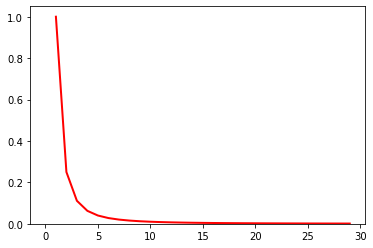

In [41]:
import re
import matplotlib.pyplot as plt
from scipy import special
import numpy as np

#limit words to 1000
n = 50
# frequency = {key:value for key,value in frequency.items()[0:n]}

frequency = {}

for tuple_element in top_word_frequencies[0:n]:
    frequency[tuple_element[0]] = tuple_element[1]

#convert value of frequency to numpy array
s = list(frequency.values())
s = np.array(s)

#Calculate zipf and plot the data
a = 2. #  distribution parameter
count, bins, ignored = plt.hist(s[s<50], 50)
x = np.arange(1., 30.)
y = x**(-a) / special.zetac(a)
plt.plot(x, y/max(y), linewidth=2, color='r')
plt.show()

In [42]:
import pandas as pd
# pd.DataFrame(word_frequencies.items())
token_frequency_pd = pd.DataFrame(top_word_frequencies[0:50], columns=['token', 'frequency'])


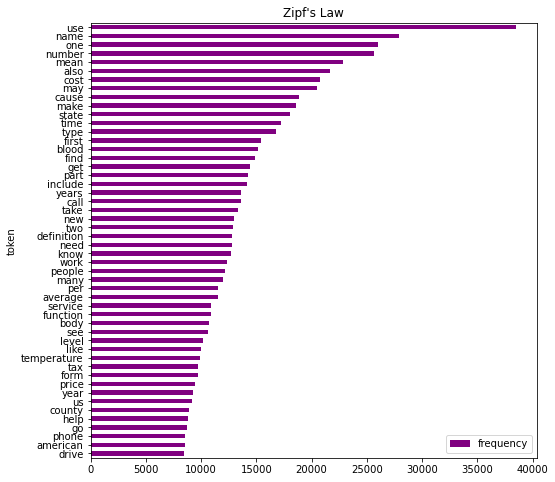

In [43]:
fig, ax = plt.subplots(figsize=(8, 8))

# Plot horizontal bar graph
token_frequency_pd.sort_values(by='frequency').plot.barh(x='token',
                      y='frequency',
                      ax=ax,
                      color="purple")

ax.set_title("Zipf's Law")

plt.show()

# Inverted Index

In [44]:
tokens

['definition',
 'rna',
 'along',
 'examples',
 'type',
 'rna',
 'molecules',
 'definition',
 'rna',
 'along',
 'examples',
 'type',
 'rna',
 'molecules',
 'rna',
 'definition',
 'best',
 'answer',
 'ar',
 'designation',
 'come',
 'name',
 'company',
 'produce',
 'firearm',
 'armalite',
 'common',
 'misconception',
 'stand',
 'assault',
 'rifle',
 'wikipedia',
 'ar15',
 'base',
 '762mm',
 'ar10',
 'design',
 'eugene',
 'stoner',
 'fairchild',
 'armalite',
 'corporation',
 'ar',
 'really',
 'mean',
 'post',
 'quality',
 'ar',
 'barrel',
 'jul',
 'ar',
 'article',
 'years',
 'media',
 'program',
 'public',
 'think',
 'ar',
 'stand',
 'assault',
 'rifle',
 'case',
 'follow',
 'short',
 'history',
 'overview',
 'armalite',
 'rifle',
 'oxycontin',
 'generally',
 'prescribe',
 'without',
 'acetominophen',
 'oxycodone',
 'generally',
 'prescribe',
 'show',
 'drug',
 'panel',
 'last',
 'system',
 'upto',
 'days',
 'last',
 'dose',
 'depend',
 'frequency',
 'strength',
 'personal',
 'metabolism'

## Extracting Pid and Passages

In [45]:
candidate_passages_top1000

,qid,pid,query,passage
0,494835,7130104,"sensibilities, definition",This is the definition of RNA along with examp...
1,1128373,7130104,iur definition,This is the definition of RNA along with examp...
2,131843,7130104,definition of a sigmet,This is the definition of RNA along with examp...
3,20455,7130335,ar glasses definition,Best Answer: The AR designation comes from the...
4,719381,7130335,what is ar balance,Best Answer: The AR designation comes from the...
...,...,...,...,...
189872,1056204,79980,who was the first steam boat operator,Other operators with special formats accept mo...
189873,1132213,7998257,how long to hold bow in yoga,You may be surprised that to learn that yoga t...
189874,324211,7998651,how much money a united airline get as a capta...,Find cheap airline tickets & deals on flights ...
189875,1116341,7998709,closed ended mortgage definition,"What is a wrap-around mortgage, and who is it ..."


In [46]:
passage_dict = {}
for idx, row in candidate_passages_top1000.iterrows():
    pid = row['pid']
    passage = row['passage']
#     if pid not in passage_dict:
#         passage_dict[pid] = None
#     passage_dict[pid] = passage
    passage_dict[passage] = pid

    

In [47]:
passage_dict

{'This is the definition of RNA along with examples of types of RNA molecules. This is the definition of RNA along with examples of types of RNA molecules. RNA Definition': 7130104,
 'Best Answer: The AR designation comes from the name of the company that produced the firearm - Armalite. It is a common misconception that it stands for assault rifle. From Wikipedia: The AR-15 is based on the 7.62mm AR-10, designed by Eugene Stoner of the Fairchild ArmaLite corporation.': 7130335,
 'What does AR really mean? Posted by Quality AR barrels | Jul 29, 2016 | AR Articles | Over the years the media has programmed the public into thinking that AR stands for Assault Rifle. This is not the case. To follow is a short history and overview of the ArmaLite rifle.': 7130336,
 'Oxycontin is generally prescribed without acetominophen while oxycodone is generally prescribed with. The will show the same on a drug panel. They last in your system for upto 5 days after your last dose depending on your frequen

In [48]:
len(passage_dict)

182469

In [49]:
inverted_index = {}


In [ ]:
for token in tokens:
    inverted_index[token] = []
    for passage in passage_dict.keys():
        if token in passage:
            inverted_index[token].append(passage_dict[passage])
